# Identificação de Bancos de Areia no Rio Tapajós com U-Net (Transfer Learning)

Segmentação semântica de bancos de areia usando imagens multiespectrais Sentinel-2 (B2, B3,
B4, B8, B11, B12 + índices NDWI/MNDWI), com **U-Net + encoder pré-treinado (ImageNet)** via
`segmentation-models-pytorch`, validação cruzada aninhada (nested K-Fold) e busca de
hiperparâmetros com Optuna.

**Estrutura esperada dos dados:**
```
images/<id>.tif   -> imagem com 6 bandas empilhadas (bandas, H, W)
masks/<id>.tif    -> máscara binária (H, W), 1 = banco de areia
```


## 1. Imports 

In [43]:
!pip install -q optuna segmentation-models-pytorch

import os
import glob
import random

import numpy as np
import rasterio

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, StratifiedKFold

import optuna
optuna.logging.set_verbosity(optuna.logging.WARNING)

import segmentation_models_pytorch as smp  # U-Net com encoder pré-treinado (ImageNet)

SEED = 42
random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", device)


Device: cuda


## 2. Configuração

`in_channels` agora é 6 bandas + 2 índices espectrais (NDWI, MNDWI) calculados no Dataset.

**Novo: tiling adaptativo.** Se uma cena for maior que `img_size`, ela agora vira **vários
patches sobrepostos** (`patch_stride_ratio` controla a sobreposição: 0.5 = 50%) em vez de um
único recorte central, multiplica os dados de treino sem precisar rotular nada novo. Se a
cena já for do tamanho `img_size`, vira 1 patch só, exatamente como antes (fallback seguro,
testado com dados sintéticos).

In [44]:
CONFIG = {
    "images_dir": "/kaggle/input/datasets/gabrielalvesdsa/bancos-de-areia/bancos-de-areia/images",
    "masks_dir": "/kaggle/input/datasets/gabrielalvesdsa/bancos-de-areia/bancos-de-areia/masks",
    "bands": ["B2", "B3", "B4", "B8", "B11", "B12"],
    "in_channels": len(["B2", "B3", "B4", "B8", "B11", "B12"]) + 2,  # + NDWI + MNDWI

    "img_size": 144,
    "patch_stride_ratio": 0.5,  # sobreposição entre patches quando a cena é maior que img_size
    "grad_clip": 1.0,

    "n_folds_outer": 5,
    "epochs_outer_final": 45,   # antes: 30. Modelo tinha espaço pra convergir mais.

    "checkpoint_dir": "/kaggle/working",
}

SEARCH = {
    "n_trials_inner": 15,       # acima do n_startup_trials (10) do TPESampler -> busca de verdade
    "epochs_inner_search": 12,  # reduzido um pouco pra compensar o custo de mais trials
}


## 3. Dataset

Leitura via `rasterio`, com `NaN`/`Inf` de nodata zerados antes da normalização.

**Novo: índices espectrais NDWI e MNDWI como canais extras.** São fórmulas físicas
conhecidas pra separar água/areia/vegetação (usam bandas do verde, NIR e SWIR), dando à
rede um atalho pronto em vez dela precisar aprender essa relação do zero com pouco dado:

- `NDWI  = (B3 - B8)  / (B3 + B8)`
- `MNDWI = (B3 - B11) / (B3 + B11)`

**Augmentação (só quando `augment=True`):** rotação em múltiplos de 90°, flips, crop em
posição aleatória, brilho/contraste leve (±10%) e ruído gaussiano leve.

In [45]:
from rasterio.windows import Window

class BancosAreiaDataset(Dataset):
    # cada item de `pares` é (image_path, mask_path, row_off, col_off)
    # row_off/col_off = None -> lê a cena inteira; caso contrário, lê só a janela (patch)

    def __init__(self, pares, img_size=144, augment=False):
        self.pares = pares
        self.img_size = img_size
        self.augment = augment

    def __len__(self):
        return len(self.pares)

    def _read_image(self, path, row_off, col_off):
        # lê todas as bandas (cena inteira ou só a janela do patch)
        with rasterio.open(path) as src:
            if row_off is None:
                img = src.read().astype(np.float32)
            else:
                img = src.read(window=Window(col_off, row_off, self.img_size, self.img_size)).astype(np.float32)
        img = np.nan_to_num(img, nan=0.0, posinf=0.0, neginf=0.0)  # zera nodata
        return img

    def _read_mask(self, path, row_off, col_off):
        # mesma lógica da imagem, mas só a banda única da máscara
        with rasterio.open(path) as src:
            if row_off is None:
                mask = src.read(1).astype(np.float32)
            else:
                mask = src.read(1, window=Window(col_off, row_off, self.img_size, self.img_size)).astype(np.float32)
        mask = np.nan_to_num(mask, nan=0.0, posinf=0.0, neginf=0.0)
        return mask

    def _normalize(self, img):
        # reflectância Sentinel-2 vai de 0 a ~10000 -> normaliza pra faixa [0, 1]
        img = np.clip(img, 0, 10000)
        return img / 10000.0

    def _add_indices(self, img):
        # calcula NDWI e MNDWI e concatena como canais extras
        # índice = (a-b)/(a+b); eps evita divisão por zero em pixels de nodata
        eps = 1e-6
        b3, b8, b11 = img[1], img[3], img[4]  # verde, NIR, SWIR1 (ordem de CONFIG["bands"])
        ndwi = (b3 - b8) / (b3 + b8 + eps)
        mndwi = (b3 - b11) / (b3 + b11 + eps)
        return np.concatenate([img, ndwi[None], mndwi[None]], axis=0).astype(np.float32)

    def _pad(self, arr, pad_top, pad_bottom, pad_left, pad_right):
        # preenche com zero até o tamanho alvo (arr pode ter 2 ou 3 dims)
        if arr.ndim == 2:
            return np.pad(arr, ((pad_top, pad_bottom), (pad_left, pad_right)), mode="constant", constant_values=0)
        return np.pad(arr, ((0, 0), (pad_top, pad_bottom), (pad_left, pad_right)), mode="constant", constant_values=0)

    def _crop(self, arr, top, left, size):
        # recorta um quadrado de `size` x `size` a partir de (top, left)
        if arr.ndim == 2:
            return arr[top:top + size, left:left + size]
        return arr[:, top:top + size, left:left + size]

    def _crop_or_pad(self, img, mask):
        # garante que img/mask fiquem exatamente em img_size x img_size
        # para patches já lidos via window, isso é um no-op (pad=0, offset=0)
        size = self.img_size
        h, w = mask.shape

        pad_h, pad_w = max(size - h, 0), max(size - w, 0)
        pad_top, pad_bottom = pad_h // 2, pad_h - pad_h // 2
        pad_left, pad_right = pad_w // 2, pad_w - pad_w // 2

        img = self._pad(img, pad_top, pad_bottom, pad_left, pad_right)
        mask = self._pad(mask, pad_top, pad_bottom, pad_left, pad_right)

        new_h, new_w = mask.shape
        # no treino (augment=True) o recorte é em posição aleatória; fora do treino, é central
        if self.augment and new_h > size:
            top = random.randint(0, new_h - size)
        else:
            top = (new_h - size) // 2
        if self.augment and new_w > size:
            left = random.randint(0, new_w - size)
        else:
            left = (new_w - size) // 2

        return self._crop(img, top, left, size), self._crop(mask, top, left, size)

    def _augment(self, img, mask):
        # flips horizontal/vertical
        if random.random() > 0.5:
            img, mask = img[:, :, ::-1], mask[:, ::-1]
        if random.random() > 0.5:
            img, mask = img[:, ::-1, :], mask[::-1, :]

        # rotação em múltiplos de 90°
        k = random.randint(0, 3)
        if k > 0:
            img = np.rot90(img, k, axes=(1, 2))
            mask = np.rot90(mask, k)

        # brilho/contraste leve (±10%)
        if random.random() > 0.5:
            brilho = random.uniform(0.9, 1.1)
            contraste = random.uniform(0.9, 1.1)
            media = img.mean()
            img = (img - media) * contraste + media
            img = img * brilho

        # ruído gaussiano leve
        if random.random() > 0.5:
            ruido = np.random.normal(0, 0.01, img.shape).astype(np.float32)
            img = img + ruido

        img = np.clip(img, -1, 1)  # índices podem ser negativos, então não usa clip 0-1 aqui
        return img.copy(), mask.copy()

    def __getitem__(self, idx):
        image_path, mask_path, row_off, col_off = self.pares[idx]

        img = self._read_image(image_path, row_off, col_off)
        mask = self._read_mask(mask_path, row_off, col_off)

        img = self._normalize(img)
        img = self._add_indices(img)  # agora img tem CONFIG["in_channels"] canais
        img, mask = self._crop_or_pad(img, mask)
        mask = (mask > 0).astype(np.float32)  # binariza a máscara

        if self.augment:
            img, mask = self._augment(img, mask)

        img_t = torch.from_numpy(img.copy())
        mask_t = torch.from_numpy(mask.copy()).unsqueeze(0)  # adiciona dimensão de canal (1, H, W)
        return img_t, mask_t


## 3b. Tiling: expandir cenas grandes em múltiplos patches

Divide splitting em dois níveis: a **partição** (treino/validação/teste de cada fold) é
sempre decidida por **cena inteira**, nunca por patch, pra nenhum patch de uma mesma cena
vazar entre partições diferentes. Só depois de decidida a partição, cada cena é expandida em
patches. `obter_patches_da_cena` cai automaticamente pro modo antigo (1 patch = a cena
inteira) se a cena não for maior que `img_size`.

In [46]:
def obter_patches_da_cena(image_path, mask_path, img_size, stride_ratio):
    with rasterio.open(image_path) as src:
        h, w = src.height, src.width

    if h <= img_size and w <= img_size:
        return [(image_path, mask_path, None, None)]

    stride = max(int(round(img_size * stride_ratio)), 1)

    def offsets(total):
        if total <= img_size:
            return [0]
        offs = list(range(0, total - img_size + 1, stride))
        if offs[-1] != total - img_size:
            offs.append(total - img_size)  # garante que a borda da cena é coberta
        return offs

    row_offs = offsets(h)
    col_offs = offsets(w)
    return [(image_path, mask_path, r, c) for r in row_offs for c in col_offs]


def expandir_em_patches(pares_cenas, img_size, stride_ratio):
    patches = []
    for image_path, mask_path in pares_cenas:
        patches.extend(obter_patches_da_cena(image_path, mask_path, img_size, stride_ratio))
    return patches


def patch_tem_banco(patch, img_size):
    image_path, mask_path, row_off, col_off = patch
    with rasterio.open(mask_path) as src:
        if row_off is None:
            mascara = np.nan_to_num(src.read(1))
        else:
            mascara = np.nan_to_num(src.read(1, window=Window(col_off, row_off, img_size, img_size)))
    return int(np.any(mascara > 0))


## 4. Pareamento imagem ↔ máscara e verificação de consistência

In [47]:
image_paths = glob.glob(os.path.join(CONFIG["images_dir"], "*.tif"))
mask_paths = glob.glob(os.path.join(CONFIG["masks_dir"], "**", "*.tif"), recursive=True)

# indexa por id (nome do arquivo sem extensão) pra casar imagem <-> máscara
imagens_por_id = {os.path.splitext(os.path.basename(p))[0]: p for p in image_paths}
mascaras_por_id = {os.path.splitext(os.path.basename(p))[0]: p for p in mask_paths}

ids_imagens = set(imagens_por_id)
ids_mascaras = set(mascaras_por_id)

faltando_mascara = ids_imagens - ids_mascaras
faltando_imagem = ids_mascaras - ids_imagens

print("Imagens:", len(ids_imagens))
print("Máscaras:", len(ids_mascaras))
print("Sem máscara:", len(faltando_mascara))
print("Sem imagem:", len(faltando_imagem))

if faltando_mascara or faltando_imagem:
    raise ValueError("Há inconsistência entre imagens e máscaras.")

ids = sorted(ids_imagens)
pares = [(imagens_por_id[i], mascaras_por_id[i]) for i in ids]

def mascara_tem_banco(caminho_mascara):
    # rótulo binário por cena: tem pelo menos 1 pixel de banco de areia?
    with rasterio.open(caminho_mascara) as src:
        mascara = np.nan_to_num(src.read(1))
    return int(np.any(mascara > 0))

# label por cena, usado para estratificar os folds (garante proporção de positivos/negativos)
labels = np.array([mascara_tem_banco(m) for _, m in pares])
print("Total de pares:", len(pares), "| Positivas:", int(labels.sum()), "| Negativas:", int(len(labels) - labels.sum()))


Imagens: 200
Máscaras: 200
Sem máscara: 0
Sem imagem: 0
Total de pares: 200 | Positivas: 50 | Negativas: 150


## 5. Por que não separamos um conjunto de teste fixo aqui

Na validação cruzada aninhada, o **loop externo** (seção 8) já divide o dataset em
`n_folds_outer` partes, e a cada rodada uma delas vira o teste daquela rodada, nunca usada
nem no treino, nem na busca de hiperparâmetros. No final, todo mundo já foi teste de alguma
rodada, e a métrica reportada é a média entre essas rodadas.

## 6. Modelo: U-Net com encoder pré-treinado (transfer learning)

Em vez de treinar uma U-Net do zero, usamos um encoder ResNet já treinado no ImageNet
(`segmentation-models-pytorch` adapta automaticamente a primeira camada convolucional para
aceitar `in_channels` canais em vez de 3, reaproveitando os pesos pré-treinados). A ideia é
que filtros genéricos (bordas, texturas, formas) aprendidos em milhões de fotos não precisam
ser reaprendidos do zero com só 200 imagens rotuladas.


In [48]:
def build_model(encoder_name, in_channels):
    model = smp.Unet(
        encoder_name=encoder_name,
        encoder_weights="imagenet",
        in_channels=in_channels,
        classes=1,
        activation=None,  # devolve logits; sigmoid é aplicado na loss/inferência
    )
    return model.to(device)


def build_optimizer(model, lr, encoder_lr_factor, weight_decay):
    # taxa de aprendizado menor no encoder pré-treinado, maior no decoder (do zero)
    encoder_params = list(model.encoder.parameters())
    outros_params = list(model.decoder.parameters()) + list(model.segmentation_head.parameters())

    return torch.optim.Adam([
        {"params": encoder_params, "lr": lr * encoder_lr_factor},
        {"params": outros_params, "lr": lr},
    ], weight_decay=weight_decay)


## 7. Sampler ponderado, loss e funções auxiliares

In [49]:
def make_weighted_sampler(fold_labels):
    # dá mais peso à classe minoritária (bancos de areia costumam ser raros na cena)
    n_pos = fold_labels.sum()
    n_neg = len(fold_labels) - n_pos
    peso_pos = len(fold_labels) / (2 * n_pos)
    peso_neg = len(fold_labels) / (2 * n_neg)
    weights = np.where(fold_labels == 1, peso_pos, peso_neg)
    return WeightedRandomSampler(torch.as_tensor(weights, dtype=torch.double), num_samples=len(weights), replacement=True)


def dice_loss(logits, targets, eps=1e-6):
    # 1 - coeficiente Dice; penaliza baixa sobreposição entre predição e máscara
    probs = torch.sigmoid(logits)
    probs = probs.view(probs.size(0), -1)
    targets = targets.view(targets.size(0), -1)
    intersection = (probs * targets).sum(dim=1)
    union = probs.sum(dim=1) + targets.sum(dim=1)
    dice = (2 * intersection + eps) / (union + eps)
    return 1 - dice.mean()


def focal_loss(logits, targets, alpha=0.75, gamma=2.0, eps=1e-6):
    # cross-entropy ponderada que dá mais peso a exemplos difíceis (gamma) e à classe rara (alpha)
    probs = torch.sigmoid(logits).clamp(eps, 1 - eps)
    pt = torch.where(targets == 1, probs, 1 - probs)
    alpha_t = torch.where(targets == 1, alpha, 1 - alpha)
    loss = -alpha_t * (1 - pt).pow(gamma) * torch.log(pt)
    return loss.mean()


def combined_loss(logits, targets, dice_weight=1.0, focal_alpha=0.75, focal_gamma=2.0):
    # loss final = focal (foca em pixels difíceis) + dice (foca em sobreposição de área)
    focal = focal_loss(logits, targets, alpha=focal_alpha, gamma=focal_gamma)
    dice = dice_loss(logits, targets)
    return focal + dice_weight * dice


@torch.no_grad()
def evaluate_global(model, loader, threshold=0.5, dice_weight=1.0, focal_alpha=0.75, focal_gamma=2.0, eps=1e-6):
    # avalia o modelo acumulando TP/FP/FN globais (não a média por batch) -> métrica mais estável
    model.eval()
    tp = fp = fn = 0.0
    running_loss = 0.0
    n = 0

    for imgs, masks in loader:
        imgs, masks = imgs.to(device), masks.to(device)
        logits = model(imgs)
        loss = combined_loss(logits, masks, dice_weight=dice_weight, focal_alpha=focal_alpha, focal_gamma=focal_gamma)
        running_loss += loss.item() * imgs.size(0)
        n += imgs.size(0)

        preds = (torch.sigmoid(logits) > threshold).float()
        tp += (preds * masks).sum().item()
        fp += (preds * (1 - masks)).sum().item()
        fn += ((1 - preds) * masks).sum().item()

    iou = (tp + eps) / (tp + fp + fn + eps)
    dice = (2 * tp + eps) / (2 * tp + fp + fn + eps)
    precision = (tp + eps) / (tp + fp + eps)
    recall = (tp + eps) / (tp + fn + eps)

    return {"loss": running_loss / n, "iou": iou, "dice": dice, "precision": precision, "recall": recall}


def find_best_threshold(model, loader, thresholds=np.arange(0.05, 0.96, 0.05)):
    # varre thresholds de binarização e escolhe o que maximiza o IoU no split de validação
    best_t, best_iou = 0.5, -1.0
    curva = []
    for t in thresholds:
        m = evaluate_global(model, loader, threshold=float(t))
        curva.append((float(t), m["iou"]))
        if m["iou"] > best_iou:
            best_iou, best_t = m["iou"], float(t)
    return best_t, best_iou, curva


@torch.no_grad()
def predict_probs(model, dataset, batch_size=8):
    # gera as probabilidades (sigmoid) para todo o dataset, sem binarizar ainda
    loader = DataLoader(dataset, batch_size=batch_size, shuffle=False)
    model.eval()
    all_probs, all_masks = [], []
    for imgs, masks in loader:
        logits = model(imgs.to(device))
        all_probs.append(torch.sigmoid(logits).cpu().numpy())
        all_masks.append(masks.numpy())
    return np.concatenate(all_probs, axis=0)[:, 0], np.concatenate(all_masks, axis=0)[:, 0]


def metrics_from_probs(probs, masks, threshold, eps=1e-6):
    # binariza as probabilidades com um threshold fixo e calcula as métricas
    preds = (probs > threshold).astype(np.float32)
    tp = (preds * masks).sum()
    fp = (preds * (1 - masks)).sum()
    fn = ((1 - preds) * masks).sum()
    iou = (tp + eps) / (tp + fp + fn + eps)
    dice = (2 * tp + eps) / (2 * tp + fp + fn + eps)
    precision = (tp + eps) / (tp + fp + eps)
    recall = (tp + eps) / (tp + fn + eps)
    return {"iou": iou, "dice": dice, "precision": precision, "recall": recall}


def train_one_epoch(model, loader, optimizer, dice_weight, focal_alpha, focal_gamma, grad_clip):
    # um passe completo de treino (forward + backward + step) sobre o loader
    model.train()
    running_loss = 0.0
    for imgs, masks in loader:
        imgs, masks = imgs.to(device), masks.to(device)

        optimizer.zero_grad()
        logits = model(imgs)
        loss = combined_loss(logits, masks, dice_weight=dice_weight, focal_alpha=focal_alpha, focal_gamma=focal_gamma)

        if not torch.isfinite(loss):
            raise RuntimeError("Loss inválida (NaN/Inf) durante o treino.")

        loss.backward()
        torch.nn.utils.clip_grad_norm_(model.parameters(), grad_clip)  # evita gradientes explosivos
        optimizer.step()

        running_loss += loss.item() * imgs.size(0)
    return running_loss / len(loader.dataset)


## 8. Fábrica do objective do Optuna (busca interna)

O split treino/validação interno acontece **em nível de cena** (`pool_pares`/`pool_labels`),
e só depois cada lado é expandido em patches, assim nenhum patch de uma cena usada no
treino aparece (nem sobreposto) na validação.

Espaço de busca mais estreito que antes (`lr`, `weight_decay`), `encoder_name` no lugar de
`base_ch`, e `n_startup_trials` corrigido (seção 2).

In [50]:
def criar_objective(pool_pares, pool_labels):
    # split treino/validação interno em nível de CENA (evita vazamento entre patches sobrepostos)
    pool_pos = np.arange(len(pool_pares))
    inner_train_pos, inner_val_pos = train_test_split(
        pool_pos, test_size=0.2, stratify=pool_labels, random_state=SEED
    )

    inner_train_cenas = [pool_pares[i] for i in inner_train_pos]
    inner_val_cenas = [pool_pares[i] for i in inner_val_pos]

    # só depois de decidido o split, expande cada lado em patches
    inner_train_patches = expandir_em_patches(inner_train_cenas, CONFIG["img_size"], CONFIG["patch_stride_ratio"])
    inner_val_patches = expandir_em_patches(inner_val_cenas, CONFIG["img_size"], CONFIG["patch_stride_ratio"])
    inner_train_patch_labels = np.array([patch_tem_banco(p, CONFIG["img_size"]) for p in inner_train_patches])

    inner_train_ds = BancosAreiaDataset(inner_train_patches, img_size=CONFIG["img_size"], augment=True)
    inner_val_ds = BancosAreiaDataset(inner_val_patches, img_size=CONFIG["img_size"], augment=False)
    inner_sampler = make_weighted_sampler(inner_train_patch_labels)

    def objective(trial):
        # espaço de busca de hiperparâmetros
        lr = trial.suggest_float("lr", 5e-5, 2e-3, log=True)
        encoder_lr_factor = trial.suggest_float("encoder_lr_factor", 0.05, 0.5, log=True)
        weight_decay = trial.suggest_float("weight_decay", 1e-6, 5e-4, log=True)
        encoder_name = trial.suggest_categorical("encoder_name", ["resnet18", "resnet34"])
        batch_size = trial.suggest_categorical("batch_size", [4, 8, 16])
        dice_weight = trial.suggest_float("dice_weight", 0.3, 1.5)
        focal_alpha = trial.suggest_float("focal_alpha", 0.25, 0.9)
        focal_gamma = trial.suggest_float("focal_gamma", 0.5, 3.0)

        train_loader_t = DataLoader(inner_train_ds, batch_size=batch_size, sampler=inner_sampler, num_workers=2)
        val_loader_t = DataLoader(inner_val_ds, batch_size=batch_size, shuffle=False, num_workers=2)

        model_t = build_model(encoder_name, CONFIG["in_channels"])
        optimizer_t = build_optimizer(model_t, lr, encoder_lr_factor, weight_decay)

        # treina algumas épocas e reporta o IoU ao Optuna a cada época (permite pruning)
        for epoch in range(1, SEARCH["epochs_inner_search"] + 1):
            train_one_epoch(model_t, train_loader_t, optimizer_t, dice_weight, focal_alpha, focal_gamma, CONFIG["grad_clip"])
            metrics = evaluate_global(model_t, val_loader_t, threshold=0.5, dice_weight=dice_weight,
                                       focal_alpha=focal_alpha, focal_gamma=focal_gamma)
            trial.report(metrics["iou"], epoch)
            if trial.should_prune():
                raise optuna.exceptions.TrialPruned()  # trial fraco: interrompe cedo pra economizar tempo

        # ao fim do trial, guarda o melhor threshold encontrado (usado depois no fold externo)
        best_t, best_iou, _ = find_best_threshold(model_t, val_loader_t)
        trial.set_user_attr("best_threshold", best_t)
        return best_iou

    return objective, inner_train_ds, inner_val_ds, inner_sampler


## 9. Validação cruzada aninhada (nested K-Fold)

Para cada fold externo: expande as cenas de treino/teste em patches → busca interna de
hiperparâmetros → treino final → threshold escolhido só com o split interno → avaliação no
fold de teste externo.



In [51]:
outer_skf = StratifiedKFold(n_splits=CONFIG["n_folds_outer"], shuffle=True, random_state=SEED)

outer_results = []
outer_models_paths = []
outer_best_params_list = []
oof_records = []  # cada item: dict com prob, pred (já binarizada c/ threshold do fold), mask, patch

for outer_fold, (outer_train_pos, outer_test_pos) in enumerate(outer_skf.split(np.zeros(len(pares)), labels), start=1):
    print(f"\n========== FOLD EXTERNO {outer_fold}/{CONFIG['n_folds_outer']} ==========")

    # split externo é sempre por cena inteira (garantido pelo StratifiedKFold sobre `pares`)
    outer_train_cenas = [pares[i] for i in outer_train_pos]
    outer_train_labels = labels[outer_train_pos]
    outer_test_cenas = [pares[i] for i in outer_test_pos]

    outer_test_patches = expandir_em_patches(outer_test_cenas, CONFIG["img_size"], CONFIG["patch_stride_ratio"])
    outer_test_ds = BancosAreiaDataset(outer_test_patches, img_size=CONFIG["img_size"], augment=False)

    # 1) busca interna de hiperparâmetros, usando só as cenas de treino deste fold
    objective, inner_train_ds, inner_val_ds, inner_sampler = criar_objective(outer_train_cenas, outer_train_labels)

    study = optuna.create_study(
        direction="maximize",
        sampler=optuna.samplers.TPESampler(seed=SEED, n_startup_trials=5),
        pruner=optuna.pruners.MedianPruner(n_warmup_steps=6),
    )
    study.optimize(objective, n_trials=SEARCH["n_trials_inner"], show_progress_bar=False)
    best_params = study.best_params
    print(f"[Fold {outer_fold}] {len(inner_train_ds)} patches treino | {len(outer_test_ds)} patches teste "
          f"| melhores hiperparâmetros: {best_params}")

    # 2) treino final do fold, com os melhores hiperparâmetros encontrados na busca interna
    train_loader_f = DataLoader(inner_train_ds, batch_size=best_params["batch_size"], sampler=inner_sampler, num_workers=2)
    val_loader_f = DataLoader(inner_val_ds, batch_size=best_params["batch_size"], shuffle=False, num_workers=2)

    model_f = build_model(best_params["encoder_name"], CONFIG["in_channels"])
    optimizer_f = build_optimizer(model_f, best_params["lr"], best_params["encoder_lr_factor"], best_params["weight_decay"])
    scheduler_f = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_f, mode="max", factor=0.5, patience=5)

    ckpt_path = f'{CONFIG["checkpoint_dir"]}/unet_outer_fold{outer_fold}.pt'
    best_inner_iou = 0.0

    for epoch in range(1, CONFIG["epochs_outer_final"] + 1):
        train_one_epoch(model_f, train_loader_f, optimizer_f,
                         best_params["dice_weight"], best_params["focal_alpha"], best_params["focal_gamma"],
                         CONFIG["grad_clip"])
        metrics = evaluate_global(model_f, val_loader_f, threshold=0.5,
                                   dice_weight=best_params["dice_weight"], focal_alpha=best_params["focal_alpha"],
                                   focal_gamma=best_params["focal_gamma"])
        scheduler_f.step(metrics["iou"])
        if metrics["iou"] > best_inner_iou:  # salva só o melhor checkpoint do fold (early-stopping implícito)
            best_inner_iou = metrics["iou"]
            torch.save({
                "epoch": epoch,
                "model_state_dict": model_f.state_dict(),
                "iou": metrics["iou"],
                "best_params": best_params,
            }, ckpt_path)

    checkpoint = torch.load(ckpt_path, map_location=device)  # recarrega o melhor checkpoint do fold
    model_f.load_state_dict(checkpoint["model_state_dict"])
    outer_models_paths.append(ckpt_path)
    outer_best_params_list.append(best_params)

    # 3) threshold de binarização escolhido só com o split de validação interno (nunca com o teste)
    best_threshold_f, _, _ = find_best_threshold(model_f, val_loader_f)

    # 4) avaliação final no fold de teste externo, nunca visto no treino nem na busca de hiperparâmetros
    test_loader_f = DataLoader(outer_test_ds, batch_size=best_params["batch_size"], shuffle=False, num_workers=2)
    outer_metrics = evaluate_global(model_f, test_loader_f, threshold=best_threshold_f,
                                     dice_weight=best_params["dice_weight"], focal_alpha=best_params["focal_alpha"],
                                     focal_gamma=best_params["focal_gamma"])
    outer_metrics.update({"fold": outer_fold, "best_threshold": best_threshold_f})
    outer_results.append(outer_metrics)

    # guarda as predições out-of-fold (já binarizadas com o threshold deste fold) para análise posterior
    probs, masks_arr = predict_probs(model_f, outer_test_ds, batch_size=best_params["batch_size"])
    preds_bin = (probs > best_threshold_f).astype(np.float32)
    for local_i, patch in enumerate(outer_test_patches):
        oof_records.append({
            "patch": patch, "prob": probs[local_i], "mask": masks_arr[local_i],
            "pred": preds_bin[local_i], "threshold": best_threshold_f,
        })

    print(f"[Fold {outer_fold}] IoU (teste externo): {outer_metrics['iou']:.4f} | "
          f"Dice: {outer_metrics['dice']:.4f} | threshold: {best_threshold_f:.2f}")

print(f"\nTotal de cenas: {len(pares)} | Total de patches (com tiling): {len(oof_records)}")



========== FOLD EXTERNO 1/5 ==========
[Fold 1] 128 patches treino | 40 patches teste | melhores hiperparâmetros: {'lr': 0.000440778407440582, 'encoder_lr_factor': 0.16836572627607443, 'weight_decay': 1.0772154377745941e-05, 'encoder_name': 'resnet34', 'batch_size': 8, 'dice_weight': 0.4172365619109659, 'focal_alpha': 0.49641642490681476, 'focal_gamma': 2.6819475521193907}
[Fold 1] IoU (teste externo): 0.1808 | Dice: 0.3062 | threshold: 0.60

========== FOLD EXTERNO 2/5 ==========
[Fold 2] 128 patches treino | 40 patches teste | melhores hiperparâmetros: {'lr': 0.0016563097558837175, 'encoder_lr_factor': 0.4619575159813623, 'weight_decay': 0.00015199881220083957, 'encoder_name': 'resnet18', 'batch_size': 4, 'dice_weight': 0.8942122921335243, 'focal_alpha': 0.27235253872489196, 'focal_gamma': 2.7733010051969553}
[Fold 2] IoU (teste externo): 0.1557 | Dice: 0.2695 | threshold: 0.60

========== FOLD EXTERNO 3/5 ==========
[Fold 3] 128 patches treino | 40 patches teste | melhores hiperpar

## 10. Resultado consolidado da validação cruzada aninhada

In [52]:
# média e desvio padrão de cada métrica entre os 5 folds externos
for metrica in ["iou", "dice", "precision", "recall"]:
    valores = [m[metrica] for m in outer_results]
    media, desvio = np.mean(valores), np.std(valores)
    print(f"{metrica.capitalize():10s}: {media:.4f} ± {desvio:.4f}  | folds: {[round(v,3) for v in valores]}")

print("\nHiperparâmetros escolhidos em cada fold externo:")
for r, p in zip(outer_results, outer_best_params_list):
    print(f"  Fold {r['fold']}: {p}")


Iou       : 0.2017 ± 0.0462  | folds: [0.181, 0.156, 0.196, 0.186, 0.29]
Dice      : 0.3334 ± 0.0614  | folds: [0.306, 0.269, 0.328, 0.313, 0.45]
Precision : 0.3264 ± 0.0599  | folds: [0.29, 0.352, 0.273, 0.284, 0.433]
Recall    : 0.3540 ± 0.0841  | folds: [0.325, 0.218, 0.409, 0.349, 0.468]

Hiperparâmetros escolhidos em cada fold externo:
  Fold 1: {'lr': 0.000440778407440582, 'encoder_lr_factor': 0.16836572627607443, 'weight_decay': 1.0772154377745941e-05, 'encoder_name': 'resnet34', 'batch_size': 8, 'dice_weight': 0.4172365619109659, 'focal_alpha': 0.49641642490681476, 'focal_gamma': 2.6819475521193907}
  Fold 2: {'lr': 0.0016563097558837175, 'encoder_lr_factor': 0.4619575159813623, 'weight_decay': 0.00015199881220083957, 'encoder_name': 'resnet18', 'batch_size': 4, 'dice_weight': 0.8942122921335243, 'focal_alpha': 0.27235253872489196, 'focal_gamma': 2.7733010051969553}
  Fold 3: {'lr': 0.00014689372953975108, 'encoder_lr_factor': 0.11623364244752171, 'weight_decay': 1.701841881702

## 11. Métrica final agregada (Out-of-Fold, threshold por fold)

Cada patch já chega aqui binarizado com o threshold do fold que o previu (seção 9), não
buscamos mais um threshold único global, exatamente pra evitar o problema de calibração
identificado antes.

In [53]:
# junta as predições/máscaras de todos os folds num único array (out-of-fold)
oof_preds_arr = np.stack([r["pred"] for r in oof_records])
oof_masks_arr = np.stack([r["mask"] for r in oof_records])

def metrics_from_preds(preds, masks, eps=1e-6):
    # mesmas métricas de antes, mas já com preds binarizadas (threshold por fold aplicado antes)
    tp = (preds * masks).sum()
    fp = (preds * (1 - masks)).sum()
    fn = ((1 - preds) * masks).sum()
    iou = (tp + eps) / (tp + fp + fn + eps)
    dice = (2 * tp + eps) / (2 * tp + fp + fn + eps)
    precision = (tp + eps) / (tp + fp + eps)
    recall = (tp + eps) / (tp + fn + eps)
    return {"iou": iou, "dice": dice, "precision": precision, "recall": recall}

metricas_oof_final = metrics_from_preds(oof_preds_arr, oof_masks_arr)
print(f"Métricas finais (OOF, threshold por fold) -> IoU: {metricas_oof_final['iou']:.4f} "
      f"| Dice: {metricas_oof_final['dice']:.4f} | Precision: {metricas_oof_final['precision']:.4f} "
      f"| Recall: {metricas_oof_final['recall']:.4f}")


Métricas finais (OOF, threshold por fold) -> IoU: 0.2033 | Dice: 0.3379 | Precision: 0.3234 | Recall: 0.3538


## 12. Modelo final e checkpoint

A validação cruzada aninhada acima serve para **avaliar** o método. Depois dela, treinamos um único modelo final usando todas as cenas disponíveis.

Para evitar escolher o hiperparâmetro do fold que teve o melhor teste externo, os hiperparâmetros finais são obtidos pela **mediana** dos parâmetros numéricos e pela **moda** dos parâmetros categóricos escolhidos nos folds externos. O número de épocas é a mediana das épocas dos melhores checkpoints dos folds e o threshold final é a mediana dos thresholds selecionados nas validações internas.

Durante o treino final, o arquivo `/kaggle/working/unet_modelo_final.pt` é sobrescrito ao fim de cada época. Assim, ele funciona também como checkpoint para retomar o treinamento caso necessário. Ao terminar, esse mesmo arquivo contém o modelo final treinado em todas as cenas.

In [54]:
from collections import Counter

# ============================================================
# CONFIGURAÇÃO DO CHECKPOINT FINAL
# ============================================================

FINAL_CHECKPOINT_PATH = "/kaggle/working/unet_modelo_final.pt"

# Deixe False para treinar o modelo final do zero.
# Se uma execução for interrompida e o arquivo ainda existir na sessão,
# mude para True para continuar da época salva.
RESUME_FINAL = False


def carregar_checkpoint_seguro(path, map_location="cpu"):
    """
    Carrega checkpoints criados por este próprio notebook.
    Compatível com versões do PyTorch com/sem o argumento weights_only.
    """
    try:
        return torch.load(
            path,
            map_location=map_location,
            weights_only=False
        )
    except TypeError:
        return torch.load(
            path,
            map_location=map_location
        )


def moda(valores):
    return Counter(valores).most_common(1)[0][0]


def obter_parametros_finais_cv(lista_params):
    """
    Resume os hiperparâmetros encontrados nos folds externos sem escolher
    o fold que obteve o melhor resultado de teste.

    - categóricos/discretos: moda
    - contínuos: mediana
    """
    params = {}

    params["encoder_name"] = moda(
        [p["encoder_name"] for p in lista_params]
    )

    params["batch_size"] = int(
        moda([int(p["batch_size"]) for p in lista_params])
    )

    for nome in [
        "lr",
        "encoder_lr_factor",
        "weight_decay",
        "dice_weight",
        "focal_alpha",
        "focal_gamma",
    ]:
        params[nome] = float(
            np.median([float(p[nome]) for p in lista_params])
        )

    return params


# ============================================================
# 1. HIPERPARÂMETROS DO MODELO FINAL
# ============================================================

if len(outer_best_params_list) == 0:
    raise RuntimeError(
        "Execute primeiro a validação cruzada aninhada (seção 9)."
    )

final_params = obter_parametros_finais_cv(
    outer_best_params_list
)

# ============================================================
# 2. NÚMERO DE ÉPOCAS A PARTIR DOS MELHORES CHECKPOINTS DOS FOLDS
# ============================================================

epocas_melhores_folds = []

for path_ckpt in outer_models_paths:

    ckpt_fold = carregar_checkpoint_seguro(
        path_ckpt,
        map_location="cpu"
    )

    epocas_melhores_folds.append(
        int(ckpt_fold["epoch"])
    )

epochs_final = max(
    1,
    int(round(np.median(epocas_melhores_folds)))
)

# ============================================================
# 3. THRESHOLD FINAL A PARTIR DAS VALIDAÇÕES DOS FOLDS
# ============================================================

thresholds_folds = [
    float(r["best_threshold"])
    for r in outer_results
]

threshold_final = float(
    np.median(thresholds_folds)
)

print("Parâmetros finais:")
for chave, valor in final_params.items():
    print(f"  {chave}: {valor}")

print(
    "\nMelhores épocas dos folds:",
    epocas_melhores_folds
)

print(
    f"Épocas escolhidas para o treino final: {epochs_final}"
)

print(
    "Thresholds dos folds:",
    [round(t, 3) for t in thresholds_folds]
)

print(
    f"Threshold final: {threshold_final:.3f}"
)

# ============================================================
# 4. DATASET FINAL: TODAS AS CENAS
# ============================================================

all_final_patches = expandir_em_patches(
    pares,
    CONFIG["img_size"],
    CONFIG["patch_stride_ratio"]
)

all_final_patch_labels = np.array([
    patch_tem_banco(
        patch,
        CONFIG["img_size"]
    )
    for patch in all_final_patches
])

final_ds = BancosAreiaDataset(
    all_final_patches,
    img_size=CONFIG["img_size"],
    augment=True
)

# Mantém a mesma estratégia de balanceamento usada no experimento.
final_sampler = make_weighted_sampler(
    all_final_patch_labels
)

final_loader = DataLoader(
    final_ds,
    batch_size=final_params["batch_size"],
    sampler=final_sampler,
    num_workers=2
)

print(
    f"\nDataset final: {len(pares)} cenas | "
    f"{len(all_final_patches)} patches"
)

# ============================================================
# 5. MODELO E OTIMIZADOR
# ============================================================

model_final = build_model(
    final_params["encoder_name"],
    CONFIG["in_channels"]
)

optimizer_final = build_optimizer(
    model_final,
    final_params["lr"],
    final_params["encoder_lr_factor"],
    final_params["weight_decay"]
)

start_epoch = 1

# ============================================================
# 6. RETOMAR CHECKPOINT, SE DESEJADO
# ============================================================

if RESUME_FINAL and os.path.exists(FINAL_CHECKPOINT_PATH):

    checkpoint_final = carregar_checkpoint_seguro(
        FINAL_CHECKPOINT_PATH,
        map_location=device
    )

    model_final.load_state_dict(
        checkpoint_final["model_state_dict"]
    )

    if "optimizer_state_dict" in checkpoint_final:
        optimizer_final.load_state_dict(
            checkpoint_final["optimizer_state_dict"]
        )

    start_epoch = int(
        checkpoint_final["epoch"]
    ) + 1

    # Usa os valores armazenados junto do próprio modelo.
    threshold_final = float(
        checkpoint_final["threshold"]
    )

    print(
        f"\nCheckpoint encontrado. "
        f"Continuando a partir da época {start_epoch}."
    )

# ============================================================
# 7. TREINO FINAL + CHECKPOINT A CADA ÉPOCA
# ============================================================

historico_final = []

if start_epoch > epochs_final:

    print(
        "\nO checkpoint já atingiu o número de épocas "
        "definido para o modelo final."
    )

else:

    for epoch in range(
        start_epoch,
        epochs_final + 1
    ):

        train_loss = train_one_epoch(
            model_final,
            final_loader,
            optimizer_final,
            final_params["dice_weight"],
            final_params["focal_alpha"],
            final_params["focal_gamma"],
            CONFIG["grad_clip"]
        )

        historico_final.append({
            "epoch": int(epoch),
            "train_loss": float(train_loss)
        })

        # Salva ao final de TODA época.
        # Se a sessão cair, este arquivo permite continuar o treinamento.
        torch.save(
            {
                "checkpoint_version": 1,
                "epoch": int(epoch),
                "epochs_final": int(epochs_final),

                "model_state_dict": model_final.state_dict(),
                "optimizer_state_dict": optimizer_final.state_dict(),

                "threshold": float(threshold_final),
                "best_params": final_params,

                "encoder_name": final_params["encoder_name"],
                "in_channels": int(CONFIG["in_channels"]),
                "bands": list(CONFIG["bands"]),
                "img_size": int(CONFIG["img_size"]),
                "patch_stride_ratio": float(
                    CONFIG["patch_stride_ratio"]
                ),

                "fold_best_epochs": list(epocas_melhores_folds),
                "fold_thresholds": list(thresholds_folds),

                "train_loss": float(train_loss),
                "historico_final": historico_final,

                "config": dict(CONFIG),
            },
            FINAL_CHECKPOINT_PATH
        )

        print(
            f"Época {epoch:03d}/{epochs_final:03d} | "
            f"Loss: {train_loss:.6f} | "
            f"checkpoint salvo"
        )

print(
    f"\nCheckpoint do modelo final:\n"
    f"{FINAL_CHECKPOINT_PATH}"
)

if os.path.exists(FINAL_CHECKPOINT_PATH):
    tamanho_mb = (
        os.path.getsize(FINAL_CHECKPOINT_PATH)
        / (1024 ** 2)
    )

    print(
        f"Tamanho: {tamanho_mb:.2f} MB"
    )


Parâmetros finais:
  encoder_name: resnet18
  batch_size: 8
  lr: 0.0005738107040443372
  encoder_lr_factor: 0.23034375003615318
  weight_decay: 1.7018418817029176e-05
  dice_weight: 0.8942122921335243
  focal_alpha: 0.4189359134932438
  focal_gamma: 1.401855053026979

Melhores épocas dos folds: [14, 18, 21, 18, 16]
Épocas escolhidas para o treino final: 18
Thresholds dos folds: [0.6, 0.6, 0.5, 0.85, 0.5]
Threshold final: 0.600

Dataset final: 200 cenas | 200 patches
Época 001/018 | Loss: 0.934667 | checkpoint salvo
Época 002/018 | Loss: 0.870406 | checkpoint salvo
Época 003/018 | Loss: 0.835079 | checkpoint salvo
Época 004/018 | Loss: 0.782414 | checkpoint salvo
Época 005/018 | Loss: 0.779947 | checkpoint salvo
Época 006/018 | Loss: 0.725294 | checkpoint salvo
Época 007/018 | Loss: 0.727107 | checkpoint salvo
Época 008/018 | Loss: 0.705928 | checkpoint salvo
Época 009/018 | Loss: 0.740830 | checkpoint salvo
Época 010/018 | Loss: 0.714753 | checkpoint salvo
Época 011/018 | Loss: 0.6805

### 12.1 Carregar o modelo final sem treinar novamente

Depois de baixar ou voltar a usar o checkpoint, esta célula reconstrói a U-Net, carrega os pesos e recupera também o threshold utilizado na inferência.

In [55]:
def carregar_modelo_final(
    checkpoint_path=FINAL_CHECKPOINT_PATH
):
    checkpoint = carregar_checkpoint_seguro(
        checkpoint_path,
        map_location=device
    )

    params = checkpoint["best_params"]

    # encoder_weights=None evita tentar baixar pesos do ImageNet:
    # os pesos completos serão restaurados pelo state_dict do checkpoint.
    model = smp.Unet(
        encoder_name=params["encoder_name"],
        encoder_weights=None,
        in_channels=int(checkpoint["in_channels"]),
        classes=1,
        activation=None,
    ).to(device)

    model.load_state_dict(
        checkpoint["model_state_dict"]
    )

    model.eval()

    threshold = float(
        checkpoint["threshold"]
    )

    print(
        f"Modelo carregado da época "
        f"{checkpoint['epoch']}/{checkpoint['epochs_final']}"
    )

    print(
        f"Encoder: {params['encoder_name']}"
    )

    print(
        f"Threshold: {threshold:.3f}"
    )

    return model, threshold, checkpoint


# Exemplo de uso:
#
# model_final, threshold_final, checkpoint_final = carregar_modelo_final()


## 13. Visualização de Predições
Usa as predições out-of-fold já calculadas, cada uma com o threshold do fold que a gerou.

Patches positivos no dataset: 50


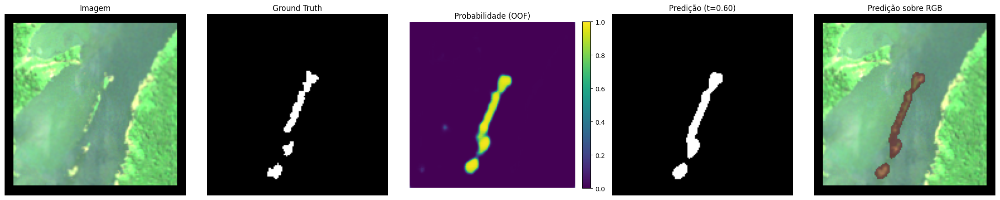

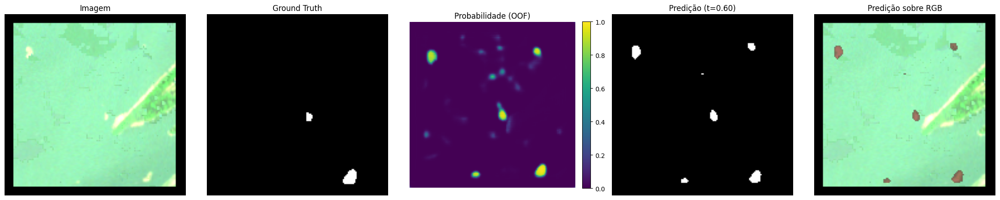

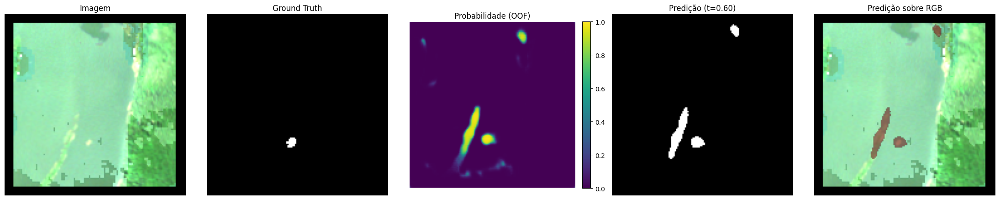

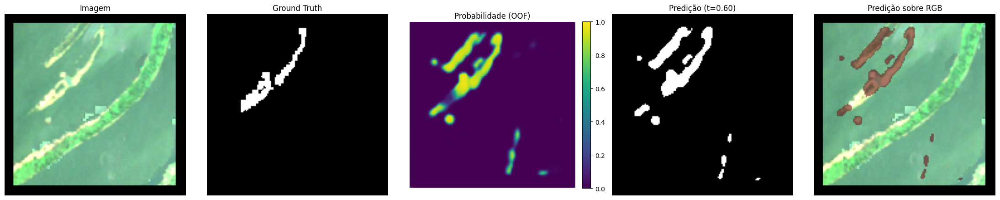

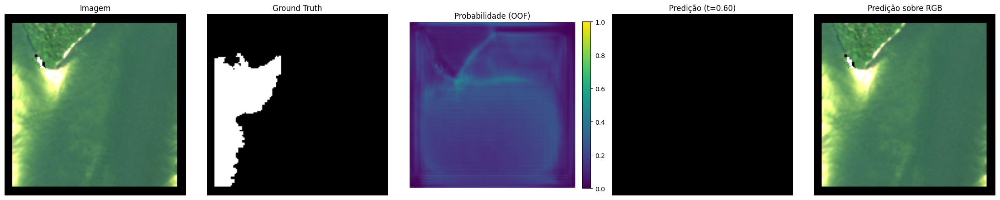

...

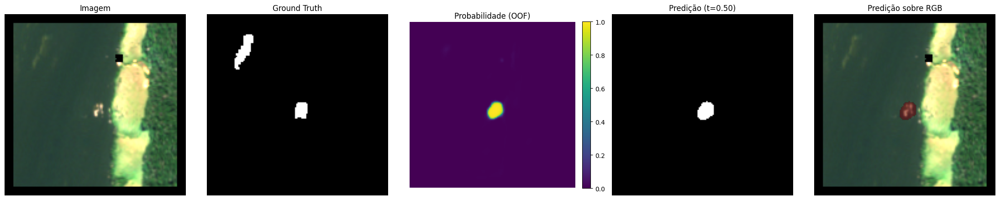

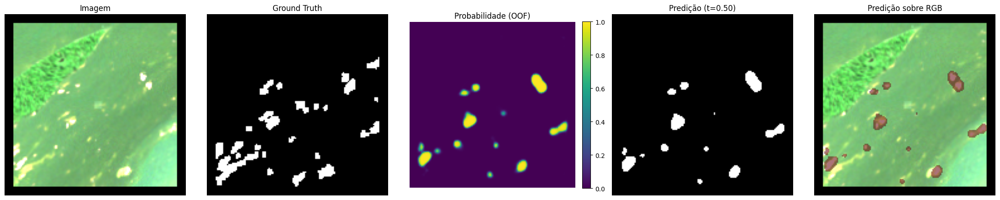

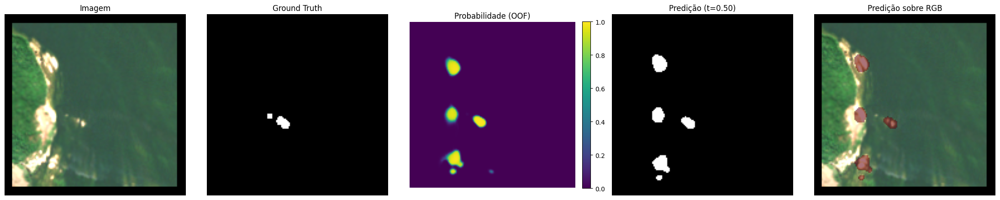

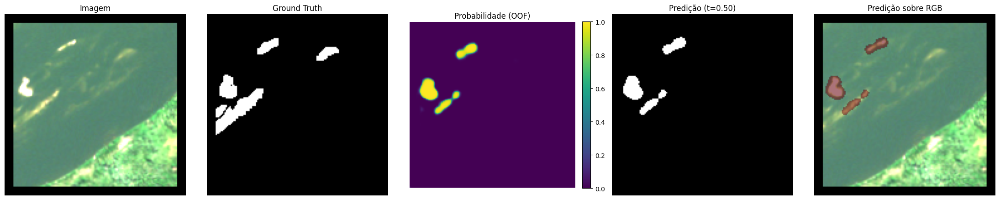

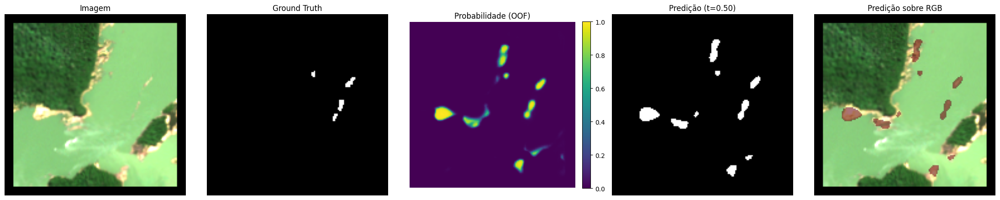

In [56]:
def mostrar_positivas_oof():
    # plota só os patches que de fato têm banco de areia na máscara (positivos)
    positivos = [r for r in oof_records if r["mask"].sum() > 0]
    print(f"Patches positivos no dataset: {len(positivos)}")

    for r in positivos:
        # recarrega a imagem original do patch (sem normalização já feita em oof_records)
        temp_ds = BancosAreiaDataset([r["patch"]], img_size=CONFIG["img_size"], augment=False)
        img_t, _ = temp_ds[0]
        img_np = img_t.numpy()

        mask_np, prob_np, pred_np, threshold = r["mask"], r["prob"], r["pred"], r["threshold"]

        # RGB natural: bandas B2 (azul), B3 (verde), B4 (vermelho) são os 3 primeiros canais
        rgb = np.stack([img_np[2], img_np[1], img_np[0]], axis=-1)
        minimo, maximo = np.percentile(rgb, 2), np.percentile(rgb, 98)  # contraste (stretch 2-98%)
        rgb = np.clip((rgb - minimo) / (maximo - minimo + 1e-8), 0, 1)

        fig, axes = plt.subplots(1, 5, figsize=(22, 5))

        axes[0].imshow(rgb); axes[0].set_title("Imagem")
        axes[1].imshow(mask_np, cmap="gray", vmin=0, vmax=1); axes[1].set_title("Ground Truth")

        im = axes[2].imshow(prob_np, cmap="viridis", vmin=0, vmax=1)
        axes[2].set_title("Probabilidade (OOF)")
        plt.colorbar(im, ax=axes[2], fraction=0.046, pad=0.04)

        axes[3].imshow(pred_np, cmap="gray", vmin=0, vmax=1)
        axes[3].set_title(f"Predição (t={threshold:.2f})")

        # sobrepõe a predição em vermelho sobre a imagem RGB
        axes[4].imshow(rgb)
        pred_overlay = np.ma.masked_where(pred_np == 0, pred_np)
        axes[4].imshow(pred_overlay, cmap="Reds", alpha=0.55, vmin=0, vmax=1)
        axes[4].set_title("Predição sobre RGB")

        for ax in axes:
            ax.axis("off")

        _, _, row_off, col_off = r["patch"]
        sufixo = f"{row_off}_{col_off}" if row_off is not None else "cena"
        plt.savefig(f"/kaggle/working/resultado_{sufixo}.png", dpi=300, bbox_inches="tight")
        plt.tight_layout()
        plt.show()


mostrar_positivas_oof()
